In [1]:
import nltk
from nltk.corpus import stopwords 
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('stopwords')
import string
import re

[nltk_data] Error loading wordnet: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>
[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [2]:
#filelist is a dictionary where key is filename and value is lemmatized token list corresponding to that document
#classes contains all the classes names
#doc contains all the file names
#class_file is a dictionary which contains class names as key and list of all the files corresponding to that class as value
#file_vocab_dict contains filename as key and content of that file as value
import os
folders=os.listdir('20_newsgroups/')
classes=[]
filelist=[]
class_file={}
doc=[]
file_vocab_dict={}
# count=0
for directory in folders:
    if directory=='comp.graphics' or directory=='sci.med' or directory =='talk.politics.misc' or directory=='rec.sport.hockey' or directory=='sci.space':
        classes.append(directory)
        files=os.listdir('20_newsgroups/'+directory)
        files=files[1:]
        temp={}
        for i in files:
            if i not in temp:
                temp[i]=1
            doc.append(i)
        class_file[directory]=temp
        for file in files:
            f=open('20_newsgroups/'+directory+"/"+file)
            myfile=f.read()
            myfile=myfile.lower()
            myfile=myfile.translate(str.maketrans(" "," ",string.punctuation))
#         myfile=re.sub(r"\d+","",myfile)
            if file not in file_vocab_dict.keys():
                file_vocab_dict[file]=myfile
            filelist.append(myfile)

In [190]:
import random
import sklearn
from sklearn.model_selection import train_test_split
shuffled_docs=[]
shuffled_docs=doc
random.shuffle(shuffled_docs)
print("Enter the percent of documents you want in training set: ")
amt=int(input())
test_amt=amt/100
test1, train1 = sklearn.model_selection.train_test_split(shuffled_docs,test_size=test_amt)
# print(len(test))
# print(len(train))
# print(test)
train={}
test={}
for i in train1:
    if i not in train:
        train[i]=1
for i in test1:
    if i not in test:
        test[i]=1
        

Enter the percent of documents you want in training set: 
50


In [191]:
print("Number of documents in training set is: ",len(train1))
print("Number of documents in testing set is: ",len(test1))

Number of documents in training set is:  2498
Number of documents in testing set is:  2497


In [192]:
# print(test)
#class_train contains class wise training document
t1={}
t2={}
t3={}
t4={}
t5={}
class_train={}

for i in train1:
    if i in class_file['comp.graphics']:
        if i not in t1:
            t1[i]=1
    elif i in class_file['sci.med']:
        if i not in t2:
            t2[i]=1
    elif i in class_file['talk.politics.misc']:
        if i not in t3:
            t3[i]=1
    elif i in class_file['rec.sport.hockey']:
        if i not in t4:
            t4[i]=1
    elif i in class_file['sci.space']:
        if i not in t5:
            t5[i]=1
            
        
class_train['comp.graphics']=t1
class_train['sci.med']=t2
class_train['talk.politics.misc']=t3
class_train['rec.sport.hockey']=t4
class_train['sci.space']=t5

In [193]:
# print("Training documents belonging to class rec.sport.hockey are:\n",class_train['rec.sport.hockey'])

In [194]:
# print(test)
#class_test contains class wise testing documents
tt1={}
tt2={}
tt3={}
tt4={}
tt5={}
class_test={}

for i in test1:
    if i in class_file['comp.graphics']:
        if i not in tt1:
            tt1[i]=1
    elif i in class_file['sci.med']:
        if i not in tt2:
            tt2[i]=1
    elif i in class_file['talk.politics.misc']:
        if i not in tt3:
            tt3[i]=1
    elif i in class_file['rec.sport.hockey']:
        if i not in tt4:
            tt4[i]=1
    elif i in class_file['sci.space']:
        if i not in tt5:
            tt5[i]=1
            
        
class_test['comp.graphics']=tt1
class_test['sci.med']=tt2
class_test['talk.politics.misc']=tt3
class_test['rec.sport.hockey']=tt4
class_test['sci.space']=tt5

In [195]:
print(len(class_train['sci.med'])+len(class_train['comp.graphics'])+len(class_train['sci.space'])+len(class_train['talk.politics.misc'])+len(class_train['rec.sport.hockey']))

2498


In [196]:
# print(class_test['sci.space'])

{'60896': 1, '61297': 1, '60837': 1, '61352': 1, '61363': 1, '62708': 1, '62392': 1, '60771': 1, '60899': 1, '60950': 1, '61486': 1, '61051': 1, '61094': 1, '61479': 1, '62117': 1, '61339': 1, '60171': 1, '60786': 1, '62413': 1, '62474': 1, '61188': 1, '60935': 1, '60872': 1, '62113': 1, '61065': 1, '61563': 1, '60994': 1, '62104': 1, '60792': 1, '60198': 1, '60240': 1, '60167': 1, '60175': 1, '61037': 1, '60784': 1, '61318': 1, '61032': 1, '61225': 1, '61359': 1, '62114': 1, '61147': 1, '61288': 1, '61466': 1, '61172': 1, '61348': 1, '61474': 1, '60170': 1, '61409': 1, '61328': 1, '61134': 1, '61317': 1, '61412': 1, '60789': 1, '61458': 1, '61253': 1, '61186': 1, '60219': 1, '61461': 1, '61023': 1, '61209': 1, '60221': 1, '61517': 1, '60930': 1, '61420': 1, '61408': 1, '61271': 1, '60957': 1, '61566': 1, '61166': 1, '61475': 1, '60843': 1, '61330': 1, '61450': 1, '60838': 1, '60902': 1, '61459': 1, '61057': 1, '61536': 1, '61252': 1, '62115': 1, '60983': 1, '60798': 1, '61087': 1, '61

In [197]:
#vocab1 contains all the vocabulary terms
#vocab contains all the unique vocaulary terms
#final_class_test contains all the training docs and their lemmatized tokens
#final_list contains each doc as key and lemmatized tokens as values
#tf_dict contains each doc as key and a dictionary of term,tf pair for each term corresponding to each doc as value
import pickle
from num2words import num2words
lem=WordNetLemmatizer()
final_list={}
tf_dict={}
vocab1=[]
class1=[]
class2=[]
class3=[]
class4=[]
class5=[]
final_class_test={}
from nltk.tokenize import word_tokenize   
stop_words = set(stopwords.words('english')) 
# ind=0
# index=0
for i in file_vocab_dict:
    t=file_vocab_dict[i]
    word_tokens = word_tokenize(t)
    mylist = [] 
    for w in word_tokens: 
        if w not in stop_words: 
            mylist.append(w) 
    temp1=[]
    temp2=[]
    for tokens in mylist:
        if(tokens.isdecimal()==True):
            tokens=num2words(tokens)
        word=lem.lemmatize(tokens) 
        temp1.append(word) 
    if i in class_train['comp.graphics']:
        for w in temp1:
            class1.append(w)
    elif i in class_train['sci.med']:
        for w in temp1:
            class2.append(w)
    elif i in class_train['talk.politics.misc']:
        for w in temp1:
            class3.append(w)
    elif i in class_train['rec.sport.hockey']:
        for w in temp1:
            class4.append(w)
    elif i in class_train['sci.space']:
        for w in temp1:
            class5.append(w)
    elif i in class_test['comp.graphics']:
        t=[]
        for w in temp1:
            t.append(w)
        final_class_test[i]=t
    elif i in class_test['sci.med']:
        tt=[]
        for w in temp1:
            tt.append(w)
        final_class_test[i]=tt
    elif i in class_test['talk.politics.misc']:
        ttt=[]
        for w in temp1:
            ttt.append(w)
        final_class_test[i]=ttt
    elif i in class_test['rec.sport.hockey']:
        tttt=[]
        for w in temp1:
            tttt.append(w)
        final_class_test[i]=tttt
    elif i in class_test['sci.space']:
        ttttt=[]
        for w in temp1:
            ttttt.append(w)
        final_class_test[i]=ttttt
#         temp2.append(word)
    temp_dict={}
    for i2 in temp1:
        vocab1.append(i2)
        if i2 not in temp_dict:
            temp_dict[i2]=temp1.count(i2)
    
    tf_dict[i]=temp_dict   
#     index+=1
    final_list[i]=temp1

In [198]:
# print(class_file['comp.graphics'])
print(len(final_class_test))
# print(final_list['178913'])

2497


In [199]:
# print(tf_dict["178913"])
#class_final is a dictionary where each class is a key and list of all the terms of that class acts as value
c1={}
c2={}
c3={}
c4={}
c5={}
train_vocab=[]
for i in class1:
    train_vocab.append(i)
    if i not in c1:
        c1[i]=1
for i in class2:
    train_vocab.append(i)
    if i not in c2:
        c2[i]=1
for i in class3:
    train_vocab.append(i)
    if i not in c3:
        c3[i]=1
for i in class4:
    train_vocab.append(i)
    if i not in c4:
        c4[i]=1
for i in class5:
    train_vocab.append(i)
    if i not in c5:
        c5[i]=1
        
class_final={}
class_final['comp.graphics']=c1
class_final['sci.med']=c2
class_final['talk.politics.misc']=c3
class_final['rec.sport.hockey']=c4
class_final['sci.space']=c5

class_with_all_terms={}
class_with_all_terms['comp.graphics']=class1
class_with_all_terms['sci.med']=class2
class_with_all_terms['talk.politics.misc']=class3
class_with_all_terms['rec.sport.hockey']=class4
class_with_all_terms['sci.space']=class5

In [200]:
# print(len(class_with_all_terms['comp.graphics']))
print("Training tokens for class sci.med are: \n",class_with_all_terms['sci.med'])

Training tokens for class sci.med are: 
 ['path', 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduux1csouiucedunewscsouiuceduariesscsuiucedumcdonald', 'mcdonaldariesscsuiucedu', 'j', 'mcdonald', 'newsgroups', 'scimed', 'subject', 'jigger', 'messageid', 'mcdonald895734049502ariesscsuiucedu', 'date', 'five', 'apr', 'ninety-three', 'two hundred and twenty-three thousand, eight hundred and twenty-two', 'gmt', 'articleid', 'ariesmcdonald895734049502', 'reference', '1ppae1bt0bigbootewpiedu', '78846cupportalcom', 'sender', 'usenetnewscsouiucedu', 'net', 'noise', 'owner', 'organization', 'uiuc', 'sc', 'line', 'thirteen', 'article', '78846cupportalcom', 'mmmcupportalcom', 'mark', 'robert', 'thorson', 'writes', 'wouldnt', 'happen', 'thing', 'chigger', 'would', 'truly', 'awful', 'parasitic', 'affliction', 'understand', 'tiny', 'bug', 'dig', 'deeply', 'skin', 'burying', 'yuck', 'thing', 'oklahoma', 'close', 'mother', 'come', 'gainesville', 'tex', 'right', 'across', 'border', 'claim', 'chigger',

In [201]:
# print(class_final['sci.med'])
train_vocab_unique={}
for i in train_vocab:
    if i not in train_vocab_unique:
        train_vocab_unique[i]=1
print(len(train_vocab))
print(len(train_vocab_unique))

496770
55111


In [202]:

vocab={}
for i in vocab1:
    if i not in vocab:
        vocab[i]=1
# print(vocab)
print(len(vocab1))
# vocab=(set(vocab1))
print(len(vocab))

999995
83758


In [203]:
tf1={}
tf2={}
tf3={}
tf4={}
tf5={}
final_train_tf={}
tft1={}
tft2={}
tft3={}
tft4={}
tft5={}
final_test_tf={}

for v in train_vocab_unique:
    s1=0
    s2=0
    s3=0
    s4=0
    s5=0
    st1=0
    st2=0
    st3=0
    st4=0
    st5=0
    for f in tf_dict:

        if f in class_train['comp.graphics']:
            if v in tf_dict[f]:
                s1+=tf_dict[f][v]
        elif f in class_train['sci.med']:
            if v in tf_dict[f]:
                s2+=tf_dict[f][v]
        elif f in class_train['talk.politics.misc']:
            if v in tf_dict[f]:
                s3+=tf_dict[f][v]
        elif f in class_train['rec.sport.hockey']:
            if v in tf_dict[f]:
                s4+=tf_dict[f][v]
        elif f in class_train['sci.space']:
            if v in tf_dict[f]:
                s5+=tf_dict[f][v]
        elif f in class_test['sci.med']:
            if v in tf_dict[f]:
                st2+=tf_dict[f][v]
        elif f in class_test['comp.graphics']:
            if v in tf_dict[f]:
                st1+=tf_dict[f][v]
        elif f in class_test['talk.politics.misc']:
            if v in tf_dict[f]:
                st3+=tf_dict[f][v]
        elif f in class_test['rec.sport.hockey']:
            if v in tf_dict[f]:
                st4+=tf_dict[f][v]
        elif f in class_test['sci.space']:
            if v in tf_dict[f]:
                st5+=tf_dict[f][v]
    tf1[v]=s1
    tf2[v]=s2
    tf3[v]=s3
    tf4[v]=s4
    tf5[v]=s5
    tft1[v]=st1
    tft2[v]=st2
    tft3[v]=st3
    tft4[v]=st4
    tft5[v]=st5
        
                

In [204]:
#final_train_tf stores classes as keys and dictionary of term,term-frequency pair for each class having training documents as values
#final_test_tf stores classes as keys and dictionary of term,term-frequency pair for each class having testing documents as values
final_train_tf['comp.graphics']=tf1
final_train_tf['sci.med']=tf2
final_train_tf['talk.politics.misc']=tf3
final_train_tf['rec.sport.hockey']=tf4
final_train_tf['sci.space']=tf5
final_test_tf['comp.graphics']=tft1
final_test_tf['sci.med']=tft2
final_test_tf['talk.politics.misc']=tft3
final_test_tf['rec.sport.hockey']=tft4
final_test_tf['sci.space']=tft5

In [205]:
# print("Term frequencies for each term in class talk.politics.misc are: \n",final_train_tf['talk.politics.misc'])

In [206]:
z=0
#idf_dict contains the idf value for each vocab term
cc1={}
cc2={}
cc3={}
cc4={}
cc5={}
idf_dict={}
for w in train_vocab_unique:
    count=0
    if w in class_final['comp.graphics']:
        count+=1
    if w in class_final['sci.med']:
        count+=1
    if w in class_final['talk.politics.misc']:
        count+=1
    if w in class_final['rec.sport.hockey']:
        count+=1
    if w in class_final['sci.space']:
        count+=1
    idf_dict[w]=count
    print(z)
    c1=0
    c2=0
    c3=0
    c4=0
    c5=0
    for f in tf_dict:
        if f in class_train['comp.graphics'] and w in tf_dict[f]:
            c1+=1
        elif f in class_train['sci.med'] and w in tf_dict[f]:
            c2+=1
        elif f in class_train['talk.politics.misc'] and w in tf_dict[f]:
            c3+=1
        elif f in class_train['rec.sport.hockey'] and w in tf_dict[f]:
            c4+=1
        elif f in class_train['sci.space'] and w in tf_dict[f]:
            c5+=1
    cc1[w]=c1
    cc2[w]=c2
    cc3[w]=c3
    cc4[w]=c4
    cc5[w]=c5
    z+=1

        

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [207]:
# print(idf_dict)



In [208]:
#dictionary for calculatig mi. This dict contains class as key and a dict of (term, number of docs in which they appear in that particular class) as values
dict_for_mi={}
dict_for_mi['comp.graphics']=cc1
dict_for_mi['sci.med']=cc2
dict_for_mi['talk.politics.misc']=cc3
dict_for_mi['rec.sport.hockey']=cc4
dict_for_mi['sci.space']=cc5

In [209]:
print(dict_for_mi['rec.sport.hockey'])

{'path': 492, 'cantaloupesrvcscmueducrabapplesrvcscmuedufs7ececmuedueuropaenggtefsdcomemorywupostuscnewshubsdsueduucssun1sdsuedusdsueduweston': 0, 'westonucssun1sdsuedu': 0, 'weston': 0, 'newsgroups': 492, 'compgraphics': 0, 'subject': 492, 'graphical': 0, 'representation': 0, 'vectorvalued': 0, 'function': 5, 'date': 492, 'five': 103, 'apr': 492, 'one thousand, nine hundred and ninety-three': 348, 'two hundred and two thousand, two hundred and twenty-eight': 0, 'gmt': 406, 'organization': 486, 'sdsu': 0, 'computing': 10, 'service': 7, 'line': 489, 'thirteen': 44, 'messageid': 492, '1pq4e4afcpandorasdsuedu': 0, 'nntppostinghost': 240, 'ucssun1sdsuedu': 0, 'gnuplot': 0, 'etc': 24, 'make': 81, 'easy': 9, 'plot': 0, 'real': 34, 'valued': 1, 'two': 168, 'variable': 0, 'want': 54, 'whose': 12, 'value': 9, '2vectors': 0, 'plotting': 0, 'array': 0, 'arrow': 0, 'complete': 8, 'arrowhead': 0, 'going': 86, 'thought': 40, 'would': 173, 'ask': 11, 'whether': 15, 'someone': 39, 'already': 15, 'done

In [210]:
import math
def mutual_info(n11, n01, n10, n00,N):
    a=0
    b=0
    c=0
    d=0
    if ((n11+n10)+(n01+n11))>0:
        t1=((n11*N)/((n11+n10)+(n01+n11)))
        if(t1>0):
            a=(n11/N)*math.log(t1,2)
    if ((n00+n01)*(n11+n01))>0:
        t2=((n01*N)/((n00+n01)*(n11+n01)))
        if t2>0:
            b=(n01/N)*math.log(t2,2)
    if ((n11+n10)*(n10+n00))>0:
        t3=((n10*N)/((n11+n10)*(n10+n00)))
        if t3>0:
            c=(n10/N)*math.log(t3,2)
    if ((n00+n01)*(n10+n00)) >0:
        t4=((n00*N)/((n00+n01)*(n10+n00)))
        if t4>0:
            d=(n00/N)*math.log(t4,2)
    return (a+b+c+d)

In [211]:
#function to sort a dictionary on the basis of values
def sort_dictionary(list1):
    li=[]
    li=sorted(list1.items(), key = lambda kv:(kv[1], kv[0]),reverse=True)
    return li

#function for getting top k tuples from a list of tuples
def get_k_tuples(list2,k):
    li2=[]
    li2=sorted(list2, key=lambda t: t[1], reverse=True)[:k]
    return li2

In [212]:
final_mi={}
N=len(train)
def mi(k):
    mi1={}

    for i in dict_for_mi['comp.graphics']:
#     print(i)
        n11=dict_for_mi['comp.graphics'][i] #word is present and doc belongs to class comp.graphics
#         print(n11)
        n01=len(class_train['comp.graphics'])-n11 #word not present but doc belongs to comp.graphics
#         print(n01)
        #n10 is word present but docs not in class comp.graphics
        n10=dict_for_mi['sci.med'][i]+dict_for_mi['sci.space'][i]+dict_for_mi['talk.politics.misc'][i]+dict_for_mi['rec.sport.hockey'][i]
        n00=len(class_train['sci.med'])+len(class_train['sci.space'])+len(class_train['talk.politics.misc'])+len(class_train['rec.sport.hockey'])-n10
        mi=mutual_info(n11,n01,n10,n00,N)
        mi1[i]=mi
    new_mi1=[]
    new_mi1=sort_dictionary(mi1)
    output1=[]
    k1=int((k/100)*len(dict_for_mi['comp.graphics']))
    output1=get_k_tuples(new_mi1,k1)
    mi2={}
    for i in dict_for_mi['sci.med']:
#     print(i)
        n11=dict_for_mi['sci.med'][i]
        n01=len(class_train['sci.med'])-n11
        n10=dict_for_mi['comp.graphics'][i]+dict_for_mi['sci.space'][i]+dict_for_mi['talk.politics.misc'][i]+dict_for_mi['rec.sport.hockey'][i]
        n00=len(class_train['comp.graphics'])+len(class_train['sci.space'])+len(class_train['talk.politics.misc'])+len(class_train['rec.sport.hockey'])-n10
        mi=mutual_info(n11,n01,n10,n00,N)
        mi2[i]=mi
    
    new_mi2=[]
    new_mi2=sort_dictionary(mi1)
    k2=int((k/100)*len(dict_for_mi['sci.med']))
    output2=[]
    output2=get_k_tuples(new_mi2,k2)
    
    
    mi3={}
    for i in dict_for_mi['talk.politics.misc']:
#     print(i)
        n11=dict_for_mi['talk.politics.misc'][i]
        n01=len(class_train['talk.politics.misc'])-n11
        n10=dict_for_mi['comp.graphics'][i]+dict_for_mi['sci.space'][i]+dict_for_mi['sci.med'][i]+dict_for_mi['rec.sport.hockey'][i]
        n00=len(class_train['comp.graphics'])+len(class_train['sci.space'])+len(class_train['sci.med'])+len(class_train['rec.sport.hockey'])-n10
        mi=mutual_info(n11,n01,n10,n00,N)
        mi3[i]=mi
    new_mi3=[]
    new_mi3=sort_dictionary(mi3)
    output3=[]
    k3=int((k/100)*len(dict_for_mi['talk.politics.misc']))
    output3=get_k_tuples(new_mi3,k3)
    mi4={}
    for i in dict_for_mi['rec.sport.hockey']:
#     print(i)
        n11=dict_for_mi['rec.sport.hockey'][i]
        n01=len(class_train['rec.sport.hockey'])-n11
        n10=dict_for_mi['comp.graphics'][i]+dict_for_mi['sci.space'][i]+dict_for_mi['sci.med'][i]+dict_for_mi['talk.politics.misc'][i]
        n00=len(class_train['comp.graphics'])+len(class_train['sci.space'])+len(class_train['sci.med'])+len(class_train['talk.politics.misc'])-n10
        mi=mutual_info(n11,n01,n10,n00,N)
        mi4[i]=mi
    new_mi4=[]
    new_mi4=sort_dictionary(mi4)
    output4=[]
    k4=int((k/100)*len(dict_for_mi['rec.sport.hockey']))
    output4=get_k_tuples(new_mi4,k4)
    mi5={}
    for i in dict_for_mi['sci.space']:
#         print(i)
        n11=dict_for_mi['sci.space'][i]
        n01=len(class_train['sci.space'])-n11
        n10=dict_for_mi['comp.graphics'][i]+dict_for_mi['rec.sport.hockey'][i]+dict_for_mi['sci.med'][i]+dict_for_mi['talk.politics.misc'][i]
        n00=len(class_train['comp.graphics'])+len(class_train['rec.sport.hockey'])+len(class_train['sci.med'])+len(class_train['talk.politics.misc'])-n10
        mi=mutual_info(n11,n01,n10,n00,N)
        mi5[i]=mi
    new_mi5=[]
    new_mi5=sort_dictionary(mi5)
    output5=[]
    k5=int((k/100)*len(dict_for_mi['sci.space']))
    output5=get_k_tuples(new_mi5,k5)
    return output1,output2,output3,output4,output5

In [213]:
def tf_idf(k):
    temp1={}
    for x in final_train_tf['comp.graphics']:
        y=math.log(1+final_train_tf['comp.graphics'][x])*idf_dict[x]
        temp1[x]=y
    new_mi1=[]
    k1=int((k/100)*len(final_train_tf['comp.graphics']))
#     print(k1)
    new_mi1=sort_dictionary(temp1)
    output1=[]
    output1=get_k_tuples(new_mi1,k1)
    
    temp2={}
    for x in final_train_tf['sci.med']:
        y=math.log(1+final_train_tf['sci.med'][x])*idf_dict[x]
        temp2[x]=y
    new_mi2=[]
    new_mi2=sort_dictionary(temp2)
    output2=[]
    k2=int((k/100)*len(final_train_tf['sci.med']))
    output2=get_k_tuples(new_mi2,k2)

    temp3={}
    for x in final_train_tf['talk.politics.misc']:
        y=math.log(1+final_train_tf['talk.politics.misc'][x])*idf_dict[x]
        temp3[x]=y
    new_mi3=[]
    new_mi3=sort_dictionary(temp3)
    output3=[]
    k3=int((k/100)*len(final_train_tf['talk.politics.misc']))
    output3=get_k_tuples(new_mi3,k3)

    temp4={}
    for x in final_train_tf['rec.sport.hockey']:
        y=math.log(1+final_train_tf['rec.sport.hockey'][x])*idf_dict[x]
        temp4[x]=y
    new_mi4=[]
    new_mi4=sort_dictionary(temp4)
    output4=[]
    k4=int((k/100)*len(final_train_tf['rec.sport.hockey']))
    output4=get_k_tuples(new_mi4,k4)

    temp5={}
    for x in final_train_tf['sci.space']:
        y=math.log(1+final_train_tf['sci.space'][x])*idf_dict[x]
        temp5[x]=y
    new_mi5=[]
    new_mi5=sort_dictionary(temp5)
    output5=[]
    k5=int((k/100)*len(final_train_tf['sci.space']))
    output5=get_k_tuples(new_mi5,k5)
    return output1,output2,output3,output4,output5

In [214]:
k=int(input("Enter the percentage of k to retrieve top k terms "))

o1,o2,o3,o4,o5=mi(k)
a1,a2,a3,a4,a5=tf_idf(k)
final_mi['comp.graphics']=o1
final_mi['sci.med']=o2

final_mi['talk.politics.misc']=o3
final_mi['rec.sport.hockey']=o4

final_mi['sci.space']=o5
tf_idf={}
tf_idf['comp.graphics']=a1
tf_idf['sci.med']=a2
tf_idf['talk.politics.misc']=a3
tf_idf['rec.sport.hockey']=a4
tf_idf['sci.space']=a5

Enter the percentage of k to retrieve top k terms 40


In [215]:

# print(tf_idf['sci.med'])
#tf_idf_final contains top k words with highest tf_idf values corresponding to each class
tf_idf_final={}
t1={}
for i in range(len(tf_idf['comp.graphics'])):
    
    if (tf_idf['comp.graphics'][i][0]) not in t1:
        t1[tf_idf['comp.graphics'][i][0]]=1
tf_idf_final['comp.graphics']=t1


t2={}
for i in range(len(tf_idf['sci.med'])):
    
    if (tf_idf['sci.med'][i][0]) not in t2:
        t2[tf_idf['sci.med'][i][0]]=1
tf_idf_final['sci.med']=t2

t3={}
for i in range(len(tf_idf['talk.politics.misc'])):
    
    if (tf_idf['talk.politics.misc'][i][0]) not in t3:
        t3[tf_idf['talk.politics.misc'][i][0]]=1
tf_idf_final['talk.politics.misc']=t3

t4={}
for i in range(len(tf_idf['rec.sport.hockey'])):
    
    if (tf_idf['rec.sport.hockey'][i][0]) not in t4:
        t4[tf_idf['rec.sport.hockey'][i][0]]=1
tf_idf_final['rec.sport.hockey']=t4

t5={}
for i in range(len(tf_idf['sci.space'])):
    
    if (tf_idf['sci.space'][i][0]) not in t5:
        t5[tf_idf['sci.space'][i][0]]=1
tf_idf_final['sci.space']=t5


In [216]:
print(final_mi['comp.graphics'])

[('line', 1.878339918693668), ('subject', 1.8771659791178703), ('path', 1.8771659791178703), ('newsgroups', 1.8771659791178703), ('messageid', 1.8771659791178703), ('date', 1.8771659791178703), ('organization', 1.8093985264222077), ('apr', 1.6134790989036507), ('gmt', 1.5873780964026833), ('compgraphics', 1.5759296590594325), ('one thousand, nine hundred and ninety-three', 1.2627555786842686), ('reference', 0.9071313988734127), ('sender', 0.905387245056989), ('university', 0.8599867308955914), ('nntppostinghost', 0.802525981387535), ('would', 0.6459473970571843), ('ninety-three', 0.6440747700816551), ('one', 0.640147077210331), ('writes', 0.5993350246088924), ('know', 0.5950930770567432), ('graphic', 0.5795840361046642), ('thanks', 0.5698123346316233), ('xref', 0.5671648019758412), ('cantaloupesrvcscmuedu', 0.5671648019758412), ('like', 0.5401397643250136), ('article', 0.5125516289058323), ('two', 0.46366901348910267), ('computer', 0.45854814613689165), ('anyone', 0.44580914784934683),

In [217]:
#mi final contains top k words with highest tf_idf values corresponding to each class
mi_final={}
t11={}
for i in range(len(final_mi['comp.graphics'])):
    
    if (final_mi['comp.graphics'][i][0]) not in t11:
        t11[final_mi['comp.graphics'][i][0]]=1
mi_final['comp.graphics']=t11


t22={}
for i in range(len(final_mi['sci.med'])):
    
    if (final_mi['sci.med'][i][0]) not in t22:
        t22[final_mi['sci.med'][i][0]]=1
mi_final['sci.med']=t2

t33={}
for i in range(len(final_mi['talk.politics.misc'])):
    
    if (final_mi['talk.politics.misc'][i][0]) not in t33:
        t33[final_mi['talk.politics.misc'][i][0]]=1
mi_final['talk.politics.misc']=t33

t44={}
for i in range(len(final_mi['rec.sport.hockey'])):
    
    if (final_mi['rec.sport.hockey'][i][0]) not in t44:
        t44[final_mi['rec.sport.hockey'][i][0]]=1
mi_final['rec.sport.hockey']=t44

t55={}
for i in range(len(final_mi['sci.space'])):
    
    if (final_mi['sci.space'][i][0]) not in t55:
        t55[final_mi['sci.space'][i][0]]=1
mi_final['sci.space']=t55

In [218]:
print("Top",k,"% terms using tf_idf for feature selection for comp.graphics are: \n ",tf_idf_final['comp.graphics'])

Top 40 % terms using tf_idf for feature selection for comp.graphics are: 
  {'line': 1, 'file': 1, 'subject': 1, 'date': 1, 'newsgroups': 1, 'path': 1, 'organization': 1, 'messageid': 1, 'one': 1, 'apr': 1, 'gmt': 1, 'format': 1, 'one thousand, nine hundred and ninety-three': 1, 'program': 1, 'university': 1, 'data': 1, 'system': 1, 'would': 1, 'available': 1, 'color': 1, 'two': 1, 'also': 1, 'software': 1, 'computer': 1, 'use': 1, 'version': 1, 'reference': 1, 'get': 1, 'sender': 1, 'image': 1, 'like': 1, 'display': 1, 'know': 1, 'may': 1, 'package': 1, 'ftp': 1, 'nntppostinghost': 1, 'bit': 1, 'email': 1, 'article': 1, 'dont': 1, 'information': 1, 'writes': 1, 'need': 1, 'see': 1, 'ninety-three': 1, 'please': 1, 'help': 1, 'point': 1, 'using': 1, 'three': 1, 'thanks': 1, 'time': 1, 'xref': 1, 'work': 1, 'cantaloupesrvcscmuedu': 1, 'code': 1, 'site': 1, 'problem': 1, 'im': 1, 'many': 1, 'free': 1, 'window': 1, 'user': 1, 'find': 1, 'c': 1, 'good': 1, 'anyone': 1, 'could': 1, 'number':

In [219]:
print("Top",k,"% terms using tf_idf for feature selection for sci.med are: \n ",tf_idf_final['sci.med'])

Top 40 % terms using tf_idf for feature selection for sci.med are: 
  {'one': 1, 'subject': 1, 'line': 1, 'date': 1, 'organization': 1, 'newsgroups': 1, 'path': 1, 'messageid': 1, 'apr': 1, 'gmt': 1, 'reference': 1, 'would': 1, 'one thousand, nine hundred and ninety-three': 1, 'article': 1, 'writes': 1, 'know': 1, 'also': 1, 'sender': 1, 'university': 1, 'get': 1, 'dont': 1, 'people': 1, 'two': 1, 'like': 1, 'ninety-three': 1, 'time': 1, 'may': 1, 'im': 1, 'use': 1, 'effect': 1, 'nntppostinghost': 1, 'problem': 1, 'food': 1, 'year': 1, 'many': 1, 'think': 1, 'study': 1, 'good': 1, 'system': 1, 'cause': 1, 'new': 1, 'information': 1, 'science': 1, 'day': 1, 'could': 1, 'well': 1, 'much': 1, 'even': 1, 'case': 1, 'work': 1, 'make': 1, 'say': 1, 'anyone': 1, 'help': 1, 'gordon': 1, 'used': 1, 'take': 1, 'drug': 1, 'test': 1, 'question': 1, 'medicine': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'thing': 1, 'ive': 1, 'research': 1, 'since': 1, 'u': 1, 'three': 1, 'see': 1, 'news': 1, 'way': 

In [220]:
print("Top",k,"% terms using tf_idf for feature selection for talk.politics.misc are: \n ",tf_idf_final['talk.politics.misc'])

Top 40 % terms using tf_idf for feature selection for talk.politics.misc are: 
  {'would': 1, 'one': 1, 'writes': 1, 'people': 1, 'article': 1, 'line': 1, 'q': 1, 'subject': 1, 'apr': 1, 'date': 1, 'organization': 1, 'newsgroups': 1, 'mr': 1, 'dont': 1, 'path': 1, 'messageid': 1, 'reference': 1, 'think': 1, 'gmt': 1, 'right': 1, 'president': 1, 'u': 1, 'know': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'government': 1, 'one thousand, nine hundred and ninety-three': 1, 'state': 1, 'time': 1, 'like': 1, 'get': 1, 'make': 1, 'law': 1, 'well': 1, 'new': 1, 'way': 1, 'say': 1, 'said': 1, 'two': 1, 'going': 1, 'want': 1, 'sender': 1, 'child': 1, 'university': 1, 'ninety-three': 1, 'go': 1, 'even': 1, 'american': 1, 'question': 1, 'much': 1, 'nntppostinghost': 1, 'thing': 1, 'im': 1, 'also': 1, 'could': 1, 'news': 1, 'mean': 1, 'system': 1, 'many': 1, 'men': 1, 'take': 1, 'believe': 1, 'year': 1, 'number': 1, 'made': 1, 'good': 1, 'drug': 1, 'thats': 1, 'see': 1, 'first': 1, 'world': 1, 'may':

In [221]:
print("Top",k,"% terms using tf_idf for feature selection for rec.sport.hockey are: \n ",tf_idf_final['rec.sport.hockey'])

Top 40 % terms using tf_idf for feature selection for rec.sport.hockey are: 
  {'one': 1, 'zero': 1, 'two': 1, 'game': 1, 'three': 1, 'line': 1, 'four': 1, 'subject': 1, 'apr': 1, 'date': 1, 'organization': 1, 'newsgroups': 1, 'messageid': 1, 'path': 1, 'gmt': 1, 'one thousand, nine hundred and ninety-three': 1, 'five': 1, 'six': 1, 'player': 1, 'university': 1, 'reference': 1, 'play': 1, 'writes': 1, 'seven': 1, 'would': 1, 'go': 1, 'year': 1, 'sender': 1, 'get': 1, 'article': 1, 'goal': 1, 'nntppostinghost': 1, 'time': 1, 'think': 1, 'fan': 1, 'first': 1, 'like': 1, 'new': 1, 'period': 1, 'win': 1, 'ninety-three': 1, 'league': 1, 'good': 1, 'know': 1, 'team': 1, 'dont': 1, 'last': 1, 'twenty': 1, 'canada': 1, 'ten': 1, 'see': 1, 'shot': 1, 'leaf': 1, 'point': 1, 'pittsburgh': 1, 'im': 1, 'eight': 1, 'twenty-one': 1, 'news': 1, 'v': 1, 'eleven': 1, 'well': 1, 'best': 1, 'nine': 1, 'back': 1, 'fifteen': 1, 'twenty-three': 1, 'right': 1, 'boston': 1, 'next': 1, 'john': 1, 'could': 1, 'd

In [222]:
print("Top",k,"% terms using tf_idf for feature selection for sci.space are: \n ",tf_idf_final['sci.space'])

Top 40 % terms using tf_idf for feature selection for sci.space are: 
  {'space': 1, 'line': 1, 'would': 1, 'subject': 1, 'date': 1, 'organization': 1, 'path': 1, 'newsgroups': 1, 'messageid': 1, 'one': 1, 'apr': 1, 'one thousand, nine hundred and ninety-three': 1, 'gmt': 1, 'reference': 1, 'writes': 1, 'system': 1, 'article': 1, 'like': 1, 'two': 1, 'earth': 1, 'time': 1, 'nntppostinghost': 1, 'sender': 1, 'may': 1, 'u': 1, 'moon': 1, 'get': 1, 'year': 1, 'nasa': 1, 'could': 1, 'university': 1, 'dont': 1, 'mission': 1, 'also': 1, 'planet': 1, 'much': 1, 'think': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'new': 1, 'thing': 1, 'distribution': 1, 'know': 1, 'science': 1, 'ninety-three': 1, 'three': 1, 'station': 1, 'sun': 1, 'first': 1, 'program': 1, 'pat': 1, 'cost': 1, 'make': 1, 'news': 1, 'world': 1, 'day': 1, 'satellite': 1, 'see': 1, 'way': 1, 'data': 1, 'use': 1, 'people': 1, 'project': 1, 'go': 1, 'well': 1, 'im': 1, 'flight': 1, 'might': 1, 'part': 1, 'question': 1, 'idea': 1, '

In [223]:
print("Top",k,"% terms using MI for feature selection for rec.sport.hockey are: \n ",mi_final['rec.sport.hockey'])


Top 40 % terms using MI for feature selection for rec.sport.hockey are: 
  {'recsporthockey': 1, 'apr': 1, 'subject': 1, 'path': 1, 'newsgroups': 1, 'messageid': 1, 'date': 1, 'line': 1, 'organization': 1, 'gmt': 1, 'one thousand, nine hundred and ninety-three': 1, 'reference': 1, 'game': 1, 'sender': 1, 'university': 1, 'team': 1, 'writes': 1, 'one': 1, 'nntppostinghost': 1, 'hockey': 1, 'article': 1, 'ninety-three': 1, 'would': 1, 'go': 1, 'two': 1, 'playoff': 1, 'player': 1, 'get': 1, 'year': 1, 'like': 1, 'time': 1, 'nhl': 1, 'play': 1, 'think': 1, 'three': 1, 'know': 1, 'fan': 1, 'last': 1, 'good': 1, 'dont': 1, 'six': 1, 'first': 1, 'twenty': 1, 'season': 1, 'win': 1, 'news': 1, 'see': 1, 'well': 1, 'cup': 1, 'twenty-one': 1, 'four': 1, 'even': 1, 'five': 1, 'im': 1, 'could': 1, 'new': 1, 'twenty-three': 1, 'goal': 1, 'fifteen': 1, 'also': 1, 'canada': 1, 'many': 1, 'way': 1, 'back': 1, 'sixteen': 1, 'best': 1, 'going': 1, 'say': 1, 'league': 1, 'make': 1, 'much': 1, 'right': 1, 

In [224]:
print("Top",k,"% terms using MI for feature selection for talk.politics.misc are: \n ",mi_final['talk.politics.misc'])

Top 40 % terms using MI for feature selection for talk.politics.misc are: 
  {'apr': 1, 'line': 1, 'subject': 1, 'path': 1, 'newsgroups': 1, 'messageid': 1, 'date': 1, 'organization': 1, 'reference': 1, 'gmt': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'writes': 1, 'article': 1, 'one thousand, nine hundred and ninety-three': 1, 'one': 1, 'people': 1, 'sender': 1, 'would': 1, 'ninety-three': 1, 'nntppostinghost': 1, 'dont': 1, 'university': 1, 'like': 1, 'u': 1, 'think': 1, 'time': 1, 'get': 1, 'two': 1, 'government': 1, 'say': 1, 'know': 1, 'make': 1, 'news': 1, 'state': 1, 'right': 1, 'new': 1, 'even': 1, 'way': 1, 'much': 1, 'twenty': 1, 'many': 1, 'also': 1, 'go': 1, 'well': 1, 'opinion': 1, 'see': 1, 'want': 1, 'could': 1, 'thing': 1, 'law': 1, 'child': 1, 'im': 1, 'fact': 1, 'talkpoliticsmisc': 1, 'case': 1, 'believe': 1, 'usa': 1, 'system': 1, 'take': 1, 'part': 1, 'good': 1, 'world': 1, 'since': 1, 'first': 1, 'said': 1, 'may': 1, 'year': 1, 'mean': 1, 'really': 1, 'distribution'

In [225]:
print("Top",k,"% terms using MI for feature selection for comp.graphics are: \n ",mi_final['comp.graphics'])

Top 40 % terms using MI for feature selection for comp.graphics are: 
  {'line': 1, 'subject': 1, 'path': 1, 'newsgroups': 1, 'messageid': 1, 'date': 1, 'organization': 1, 'apr': 1, 'gmt': 1, 'compgraphics': 1, 'one thousand, nine hundred and ninety-three': 1, 'reference': 1, 'sender': 1, 'university': 1, 'nntppostinghost': 1, 'would': 1, 'ninety-three': 1, 'one': 1, 'writes': 1, 'know': 1, 'graphic': 1, 'thanks': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'like': 1, 'article': 1, 'two': 1, 'computer': 1, 'anyone': 1, 'please': 1, 'file': 1, 'image': 1, 'email': 1, 'may': 1, 'get': 1, 'need': 1, 'help': 1, 'system': 1, 'program': 1, 'im': 1, 'could': 1, 'use': 1, 'dont': 1, 'distribution': 1, 'news': 1, 'looking': 1, 'replyto': 1, 'also': 1, 'time': 1, 'twenty': 1, 'world': 1, 'using': 1, 'version': 1, 'think': 1, 'problem': 1, 'software': 1, 'good': 1, 'eleven': 1, 'format': 1, 'keywords': 1, 'work': 1, 'fifteen': 1, 'new': 1, 'sixteen': 1, 'find': 1, 'much': 1, 'color': 1, '3d': 1, 't

In [226]:
print("Top",k,"5 terms using MI for feature selection for sci.med are: \n ",mi_final['sci.med'])

Top 40 5 terms using MI for feature selection for sci.med are: 
  {'one': 1, 'subject': 1, 'line': 1, 'date': 1, 'organization': 1, 'newsgroups': 1, 'path': 1, 'messageid': 1, 'apr': 1, 'gmt': 1, 'reference': 1, 'would': 1, 'one thousand, nine hundred and ninety-three': 1, 'article': 1, 'writes': 1, 'know': 1, 'also': 1, 'sender': 1, 'university': 1, 'get': 1, 'dont': 1, 'people': 1, 'two': 1, 'like': 1, 'ninety-three': 1, 'time': 1, 'may': 1, 'im': 1, 'use': 1, 'effect': 1, 'nntppostinghost': 1, 'problem': 1, 'food': 1, 'year': 1, 'many': 1, 'think': 1, 'study': 1, 'good': 1, 'system': 1, 'cause': 1, 'new': 1, 'information': 1, 'science': 1, 'day': 1, 'could': 1, 'well': 1, 'much': 1, 'even': 1, 'case': 1, 'work': 1, 'make': 1, 'say': 1, 'anyone': 1, 'help': 1, 'gordon': 1, 'used': 1, 'take': 1, 'drug': 1, 'test': 1, 'question': 1, 'medicine': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'thing': 1, 'ive': 1, 'research': 1, 'since': 1, 'u': 1, 'three': 1, 'see': 1, 'news': 1, 'way': 1, '

In [227]:
print("Top",k,"% terms using MI for feature selection for sci.space are: \n ",mi_final['sci.space'])

Top 40 % terms using MI for feature selection for sci.space are: 
  {'subject': 1, 'path': 1, 'newsgroups': 1, 'messageid': 1, 'date': 1, 'line': 1, 'organization': 1, 'apr': 1, 'scispace': 1, 'gmt': 1, 'one thousand, nine hundred and ninety-three': 1, 'reference': 1, 'writes': 1, 'space': 1, 'nntppostinghost': 1, 'sender': 1, 'would': 1, 'article': 1, 'one': 1, 'xref': 1, 'cantaloupesrvcscmuedu': 1, 'like': 1, 'university': 1, 'may': 1, 'ninety-three': 1, 'distribution': 1, 'system': 1, 'get': 1, 'two': 1, 'think': 1, 'could': 1, 'know': 1, 'also': 1, 'much': 1, 'time': 1, 'dont': 1, 'u': 1, 'thing': 1, 'news': 1, 'new': 1, 'earth': 1, 'orbit': 1, 'year': 1, 'nasa': 1, 'see': 1, 'way': 1, 'science': 1, 'make': 1, 'world': 1, 'im': 1, 'shuttle': 1, 'might': 1, 'day': 1, 'first': 1, 'people': 1, 'well': 1, 'something': 1, 'even': 1, 'use': 1, 'question': 1, 'good': 1, 'go': 1, 'work': 1, 'launch': 1, 'three': 1, 'pat': 1, 'moon': 1, 'mission': 1, 'need': 1, 'since': 1, 'high': 1, 'idea'

In [228]:
prior_prob={}
prior_prob['comp.graphics']=len(class_train['comp.graphics'])/len(train)
prior_prob['sci.med']=len(class_train['sci.med'])/len(train)
prior_prob['talk.politics.misc']=len(class_train['talk.politics.misc'])/len(train)
prior_prob['rec.sport.hockey']=len(class_train['rec.sport.hockey'])/len(train)
prior_prob['sci.space']=len(class_train['sci.space'])/len(train)



In [229]:
print("Prior probability class wise are: \n" ,prior_prob)

Prior probability class wise are: 
 {'comp.graphics': 0.21377101681345076, 'sci.med': 0.188951160928743, 'talk.politics.misc': 0.20096076861489193, 'rec.sport.hockey': 0.1969575660528423, 'sci.space': 0.19935948759007205}


In [230]:
print(class_final['comp.graphics'])

{'path': 1, 'cantaloupesrvcscmueducrabapplesrvcscmuedufs7ececmuedueuropaenggtefsdcomemorywupostuscnewshubsdsueduucssun1sdsuedusdsueduweston': 1, 'westonucssun1sdsuedu': 1, 'weston': 1, 'newsgroups': 1, 'compgraphics': 1, 'subject': 1, 'graphical': 1, 'representation': 1, 'vectorvalued': 1, 'function': 1, 'date': 1, 'five': 1, 'apr': 1, 'one thousand, nine hundred and ninety-three': 1, 'two hundred and two thousand, two hundred and twenty-eight': 1, 'gmt': 1, 'organization': 1, 'sdsu': 1, 'computing': 1, 'service': 1, 'line': 1, 'thirteen': 1, 'messageid': 1, '1pq4e4afcpandorasdsuedu': 1, 'nntppostinghost': 1, 'ucssun1sdsuedu': 1, 'gnuplot': 1, 'etc': 1, 'make': 1, 'easy': 1, 'plot': 1, 'real': 1, 'valued': 1, 'two': 1, 'variable': 1, 'want': 1, 'whose': 1, 'value': 1, '2vectors': 1, 'plotting': 1, 'array': 1, 'arrow': 1, 'complete': 1, 'arrowhead': 1, 'going': 1, 'thought': 1, 'would': 1, 'ask': 1, 'whether': 1, 'someone': 1, 'already': 1, 'done': 1, 'work': 1, 'pointer': 1, 'thanx': 1

In [231]:
#cond_prob is a dictionary which contains class name as keys and word,conditional probability of each word that belongs to that 
#particular class as value
#training in naive bayes
cond_prob={}
prob1={}
# for t in class_final['comp.graphics']:
for t in train_vocab_unique:
    tf=final_train_tf['comp.graphics'][t]
    V=len(class_with_all_terms['comp.graphics'])
    B=len(train_vocab_unique)
    prob=(tf+1)/(B+V)
    prob1[t]=prob
cond_prob['comp.graphics']=prob1
    
prob2={}
for t in train_vocab_unique:
    tf=final_train_tf['sci.med'][t]
    V=len(class_with_all_terms['sci.med'])
    B=len(train_vocab_unique)
    prob=(tf+1)/(B+V)
    prob2[t]=prob
cond_prob['sci.med']=prob2

prob3={}
for t in train_vocab_unique:
    tf=final_train_tf['talk.politics.misc'][t]
    V=len(class_with_all_terms['talk.politics.misc'])
    B=len(train_vocab_unique)
    prob=(tf+1)/(B+V)
    prob3[t]=prob
cond_prob['talk.politics.misc']=prob3

prob4={}
for t in train_vocab_unique:
    tf=final_train_tf['rec.sport.hockey'][t]
    V=len(class_with_all_terms['rec.sport.hockey'])
    B=len(train_vocab_unique)
    prob=(tf+1)/(B+V)
    prob4[t]=prob
cond_prob['rec.sport.hockey']=prob4

prob5={}
for t in train_vocab_unique:
    tf=final_train_tf['sci.space'][t]
    V=len(class_with_all_terms['sci.space'])
    B=len(train_vocab_unique)
    prob=(tf+1)/(B+V)
    prob5[t]=prob
cond_prob['sci.space']=prob5



In [232]:
# print("Conditional probability for class comp.graphics are:\n" ,cond_prob['comp.graphics'])


In [233]:
# print("Conditional probability for class sci.med are:\n" ,cond_prob['sci.med'])

In [234]:
# print("Conditional probability for class talk.politics.misc are:\n" ,cond_prob['talk.politics.misc'])

In [235]:
# print("Conditional probability for class rec.sport.hockey are:\n" ,cond_prob['rec.sport.hockey'])

In [236]:
# print("Conditional probability for class sci.space are:\n" ,cond_prob['sci.space'])

In [237]:
final_ans={}
for t in final_class_test:
#     print(t)
    mul1=0
    mul2=0
    mul3=0
    mul4=0
    mul5=0
    for term in final_class_test[t]:
        if term in tf_idf_final['comp.graphics']:
            pro=math.log(cond_prob['comp.graphics'][term])
            mul1=mul1+pro
#             if mul1==0:
#                 print(term) 
        else:
            V=len(class_with_all_terms['comp.graphics'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul1=mul1+pro
            
#         print(mul1)
        if term in tf_idf_final['sci.med']:
            pro=math.log(cond_prob['sci.med'][term])
            mul2=mul2+pro
        else:
            V=len(class_with_all_terms['sci.med'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul2=mul2+pro 
        if term in tf_idf_final['talk.politics.misc']:
            pro=math.log(cond_prob['talk.politics.misc'][term])
            mul3=mul3+pro
        else:
            V=len(class_with_all_terms['talk.politics.misc'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul3=mul3+pro 
        if term in tf_idf_final['rec.sport.hockey']:
            pro=math.log(cond_prob['rec.sport.hockey'][term])
            mul4=mul4+pro
        else:
            V=len(class_with_all_terms['rec.sport.hockey'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul4=mul4+pro 
        if term in tf_idf_final['sci.space']:
            pro=math.log(cond_prob['sci.space'][term])
            mul5=mul5+pro
        else:
            V=len(class_with_all_terms['sci.space'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul5=mul5+pro
        
    rank={}
#     print(mul1)
    rank['comp.graphics']=math.log(prior_prob['comp.graphics'])+mul1
#     print(rank['comp.graphics'])
    rank['sci.med']=math.log(prior_prob['sci.med'])+mul2
#     print(rank['sci.med'])
    rank['talk.politics.misc']=math.log(prior_prob['talk.politics.misc'])+mul3
    rank['rec.sport.hockey']=math.log(prior_prob['rec.sport.hockey'])+mul4
    rank['sci.space']=math.log(prior_prob['sci.space'])+mul5
#     print(rank['sci.space'])
#     print(rank)
    final_rank=[]
    final_rank=sort_dictionary(rank)
#     print(final_rank)
    final_ans[t]=final_rank[0]
    
    
    

In [238]:

print(final_ans)

{'37914': ('comp.graphics', -1238.018569111454), '37918': ('comp.graphics', -567.257916060273), '37920': ('comp.graphics', -1335.855255481572), '37923': ('comp.graphics', -960.0848555567646), '37924': ('comp.graphics', -904.870421335809), '37925': ('comp.graphics', -802.3567593677416), '37928': ('comp.graphics', -313.62456014565225), '37933': ('comp.graphics', -549.5229231805982), '37934': ('comp.graphics', -657.1290416829024), '37937': ('comp.graphics', -1229.8525358472543), '37938': ('comp.graphics', -450.19795234233743), '37943': ('comp.graphics', -1031.2284377156586), '37945': ('comp.graphics', -721.3224144287874), '37946': ('comp.graphics', -644.4413607023619), '37948': ('comp.graphics', -1592.126634602731), '37952': ('comp.graphics', -559.6305300224828), '37955': ('comp.graphics', -2206.5305814272715), '37957': ('comp.graphics', -489.407556821468), '37959': ('comp.graphics', -815.2753235758711), '37963': ('comp.graphics', -649.7573550887029), '38099': ('comp.graphics', -871.15521

In [239]:
final_ans_mi={}
for t in final_class_test:
#     print(t)
    mul1=0
    mul2=0
    mul3=0
    mul4=0
    mul5=0
    for term in final_class_test[t]:
        if term in mi_final['comp.graphics']:
            pro=math.log(cond_prob['comp.graphics'][term])
            mul1=mul1+pro
#             if mul1==0:
#                 print(term) 
        else:
            V=len(class_with_all_terms['comp.graphics'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul1=mul1+pro
            
        if term in mi_final['sci.med']:
            if term=='compgraphics':
                continue
            else:
                pro=math.log(cond_prob['sci.med'][term])
                mul2=mul2+pro
        else:
            V=len(class_with_all_terms['sci.med'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul2=mul2+pro 
        if term in mi_final['talk.politics.misc']:
            if term=="compgraphics":
                continue
            else:
                pro=math.log(cond_prob['talk.politics.misc'][term])
                mul3=mul3+pro
        else:
            V=len(class_with_all_terms['talk.politics.misc'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul3=mul3+pro 
        if term in mi_final['rec.sport.hockey']:
            if term=="compgraphics":
                continue
            else:
                pro=math.log(cond_prob['rec.sport.hockey'][term])
                mul4=mul4+pro
        else:
            V=len(class_with_all_terms['rec.sport.hockey'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul4=mul4+pro 
        if term in mi_final['sci.space']:
            if term=='compgraphics':
                continue
            else:
                pro=math.log(cond_prob['sci.space'][term])
                mul5=mul5+pro
        else:
            V=len(class_with_all_terms['sci.space'])
            B=len(train_vocab_unique)
            pro=math.log(1/(V+B))
            mul5=mul5+pro
        
    rank={}

    rank['comp.graphics']=math.log(prior_prob['comp.graphics'])+mul1
#     print(rank['comp.graphics'])
    rank['sci.med']=math.log(prior_prob['sci.med'])+mul2
#     print(rank['sci.med'])
    rank['talk.politics.misc']=math.log(prior_prob['talk.politics.misc'])+mul3
    rank['rec.sport.hockey']=math.log(prior_prob['rec.sport.hockey'])+mul4
    rank['sci.space']=math.log(prior_prob['sci.space'])+mul5
#     print(rank['sci.space'])
#     print(rank)
    final_rank=[]
    final_rank=sort_dictionary(rank)
#     print(final_rank)
    final_ans_mi[t]=final_rank[0]
    
    
    

In [240]:
actual={}
#actual contains test file name as key and actual class to which the file belongs as values
#predicted_tfidf contains test file name as keys and predicted class names (using tf_idf as feature selection) corresponding to that file as values
#predicted_tfidf contains test file name as keys and predicted class names (using  as feature selection) corresponding to that file as value
predicted_tfidf={}
predicted_mi={}
for i in test:
    if i in class_test['comp.graphics']:
        actual[i]='comp.graphics'
    elif i in class_test['sci.med']:
        actual[i]='sci.med'
    elif i in class_test['talk.politics.misc']:
        actual[i]='talk.politics.misc'
    elif i in class_test['rec.sport.hockey']:
        actual[i]='rec.sport.hockey'
    else:
        actual[i]='sci.space'
    predicted_tfidf[i]=final_ans[i][0]
    predicted_mi[i]=final_ans_mi[i][0]
    

In [241]:
print("Actual classes for test documents are: \n" ,actual)
actual1=[]
for i in actual:
    actual1.append(actual[i])
# print(actual1)

Actual classes for test documents are: 
 {'176932': 'talk.politics.misc', '60896': 'sci.space', '59206': 'sci.med', '38559': 'comp.graphics', '54069': 'rec.sport.hockey', '58956': 'sci.med', '179049': 'talk.politics.misc', '178369': 'talk.politics.misc', '53580': 'rec.sport.hockey', '39061': 'comp.graphics', '179043': 'talk.politics.misc', '178719': 'talk.politics.misc', '38234': 'comp.graphics', '178486': 'talk.politics.misc', '178438': 'talk.politics.misc', '61297': 'sci.space', '179095': 'talk.politics.misc', '38692': 'comp.graphics', '59266': 'sci.med', '59358': 'sci.med', '52599': 'rec.sport.hockey', '54087': 'rec.sport.hockey', '54738': 'rec.sport.hockey', '59225': 'sci.med', '178555': 'talk.politics.misc', '60837': 'sci.space', '53738': 'rec.sport.hockey', '38703': 'comp.graphics', '38901': 'comp.graphics', '38374': 'comp.graphics', '52556': 'rec.sport.hockey', '38723': 'comp.graphics', '53875': 'rec.sport.hockey', '38463': 'comp.graphics', '52594': 'rec.sport.hockey', '59146': 

In [242]:
print("Predicted classes for test files using mutual information as feature selection are: \n",predicted_mi)
pred_mi=[]
for i in predicted_mi:
    pred_mi.append(predicted_mi[i])
# print(pred_mi)

Predicted classes for test files using mutual information as feature selection are: 
 {'176932': 'talk.politics.misc', '60896': 'sci.space', '59206': 'sci.med', '38559': 'comp.graphics', '54069': 'rec.sport.hockey', '58956': 'sci.med', '179049': 'talk.politics.misc', '178369': 'talk.politics.misc', '53580': 'rec.sport.hockey', '39061': 'comp.graphics', '179043': 'talk.politics.misc', '178719': 'talk.politics.misc', '38234': 'sci.space', '178486': 'talk.politics.misc', '178438': 'talk.politics.misc', '61297': 'sci.space', '179095': 'talk.politics.misc', '38692': 'comp.graphics', '59266': 'sci.med', '59358': 'sci.med', '52599': 'rec.sport.hockey', '54087': 'rec.sport.hockey', '54738': 'rec.sport.hockey', '59225': 'sci.med', '178555': 'talk.politics.misc', '60837': 'sci.space', '53738': 'rec.sport.hockey', '38703': 'comp.graphics', '38901': 'comp.graphics', '38374': 'comp.graphics', '52556': 'rec.sport.hockey', '38723': 'comp.graphics', '53875': 'rec.sport.hockey', '38463': 'comp.graphics

In [243]:
print("Predicted classes for test files using tf_idf as feature selection are: \n",predicted_tfidf)
pred_tfidf=[]
for i in predicted_tfidf:
    pred_tfidf.append(predicted_tfidf[i])
# print(pred_tfidf)

Predicted classes for test files using tf_idf as feature selection are: 
 {'176932': 'talk.politics.misc', '60896': 'sci.space', '59206': 'sci.med', '38559': 'comp.graphics', '54069': 'rec.sport.hockey', '58956': 'sci.med', '179049': 'talk.politics.misc', '178369': 'talk.politics.misc', '53580': 'rec.sport.hockey', '39061': 'comp.graphics', '179043': 'talk.politics.misc', '178719': 'talk.politics.misc', '38234': 'comp.graphics', '178486': 'talk.politics.misc', '178438': 'talk.politics.misc', '61297': 'sci.space', '179095': 'talk.politics.misc', '38692': 'comp.graphics', '59266': 'sci.med', '59358': 'sci.med', '52599': 'rec.sport.hockey', '54087': 'rec.sport.hockey', '54738': 'rec.sport.hockey', '59225': 'sci.med', '178555': 'talk.politics.misc', '60837': 'sci.space', '53738': 'rec.sport.hockey', '38703': 'comp.graphics', '38901': 'comp.graphics', '38374': 'comp.graphics', '52556': 'rec.sport.hockey', '38723': 'comp.graphics', '53875': 'rec.sport.hockey', '38463': 'comp.graphics', '5259

In [244]:
from sklearn.metrics import accuracy_score
print("accuracy after choosing tf_idf as feature selection in naive bayes is: ",accuracy_score(actual1, pred_tfidf))

accuracy after choosing tf_idf as feature selection in naive bayes is:  0.97436924309171


In [245]:
print("accuracy after choosing mutual information as feature selection in naive bayes is: ",accuracy_score(actual1, pred_mi))


accuracy after choosing mutual information as feature selection in naive bayes is:  0.9703644373247897


accuracy after choosing mutual information as feature selection in naive bayes is:  0.9703644373247897
Confusion matrix for MI is: 
 [[452   3   0   7   3]
 [  2 499   0   1   5]
 [  8   3 504   6   6]
 [ 12   0   4 478   7]
 [  1   0   2   4 490]]


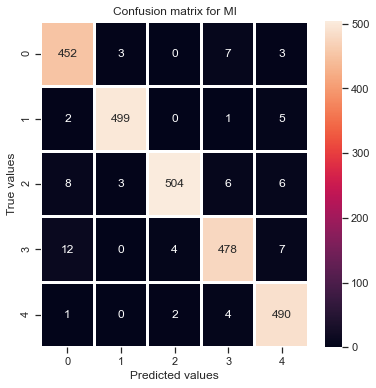

In [246]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
print("accuracy after choosing mutual information as feature selection in naive bayes is: ",accuracy_score(actual1, pred_mi))
import seaborn as sns
import seaborn as sns; sns.set(style="ticks", color_codes=True)
cm_mi = confusion_matrix(actual1, pred_mi)
print("Confusion matrix for MI is: \n",cm_mi)
fig, axes = plt.subplots(figsize=(6,6))
sns.heatmap(cm_mi,annot = True, linewidths=2,fmt=".0f",axes=axes)
plt.xlabel("Predicted values")
plt.ylabel("True values")
plt.title("Confusion matrix for MI")
plt.show()


accuracy after choosing tf_idf as feature selection in naive bayes is:  0.97436924309171
Confusion matrix for TF-IDF is: 
 [[462   0   1   1   1]
 [  2 499   0   1   5]
 [  8   3 504   6   6]
 [ 12   0   4 478   7]
 [  1   0   2   4 490]]


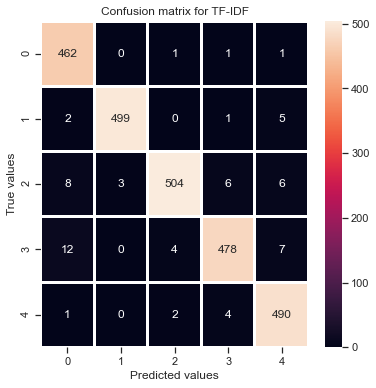

In [247]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns; sns.set(style="ticks", color_codes=True)
print("accuracy after choosing tf_idf as feature selection in naive bayes is: ",accuracy_score(actual1, pred_tfidf))
cm_tf_idf = confusion_matrix(actual1, pred_tfidf)
print("Confusion matrix for TF-IDF is: \n",cm_tf_idf)
fig, axes = plt.subplots(figsize=(6,6))
sns.heatmap(cm_tf_idf,annot = True, linewidths=2,fmt=".0f",axes=axes)
plt.xlabel("Predicted values")
plt.ylabel("True values")
plt.title("Confusion matrix for TF-IDF")
plt.show()


Text(0.5, 1.0, 'Accuracy vs top k% terms using MI as feature selection')

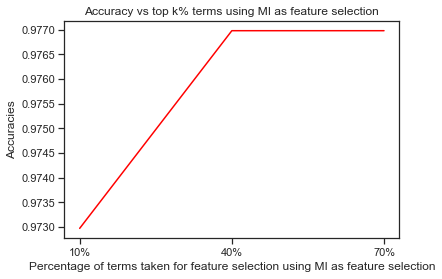

In [127]:
# k_val=["10%", "40%", "70%" ]
# a_mi=[0.972972972972973,0.9769769769769769,0.9769769769769869]
# a_tf=[0.975975975975976,0.982982982982983, 0.982982982983983]
# plt.plot(k_val, a_mi,color="red")
# plt.xlabel("Percentage of terms taken for feature selection using MI as feature selection")
# plt.ylabel("Accuracies")
# plt.title("Accuracy vs top k% terms using MI as feature selection")

Text(0.5, 1.0, 'Accuracy vs top k% terms using TF-IDf as feature selection')

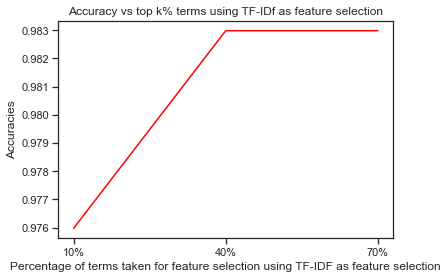

In [128]:
# plt.plot(k_val, a_tf,color="red")
# plt.xlabel("Percentage of terms taken for feature selection using TF-IDF as feature selection")
# plt.ylabel("Accuracies")
# plt.title("Accuracy vs top k% terms using TF-IDf as feature selection")

Text(0.5, 1.0, 'Accuracy vs different splitting ratio using MI as feature selection')

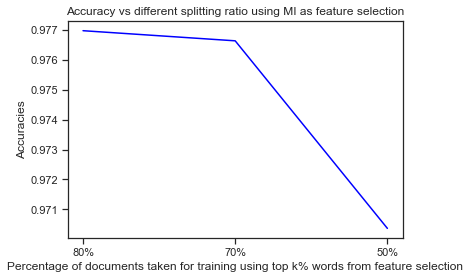

In [251]:
a=[0.9769769769769769,0.9766381842456608,0.9703644373247897]

p=["80%", "70%", "50%"]

plt.plot(p, a,color="blue")
plt.xlabel("Percentage of documents taken for training using top k% words from feature selection")
plt.ylabel("Accuracies")
plt.title("Accuracy vs different splitting ratio using MI as feature selection")

Text(0.5, 1.0, 'Accuracy vs different splitting ratio using TF-IDF as feature selection')

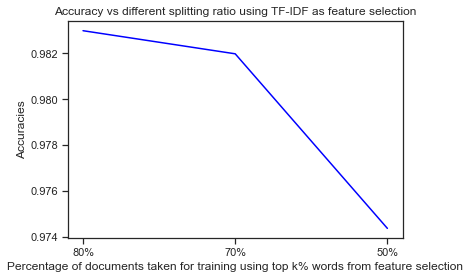

In [249]:
a1=[0.982982982982983,0.9819759679572764,0.97436924309171]
p=["80%", "70%", "50%"]
plt.plot(p, a1,color="blue")
plt.xlabel("Percentage of documents taken for training using top k% words from feature selection")
plt.ylabel("Accuracies")
plt.title("Accuracy vs different splitting ratio using TF-IDF as feature selection")